### Dec 12 2018

### Conv1

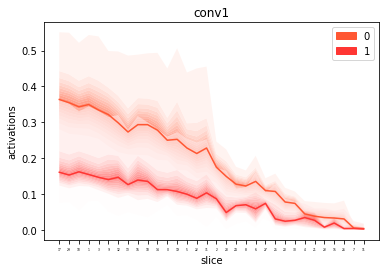

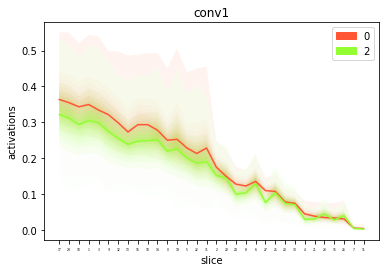

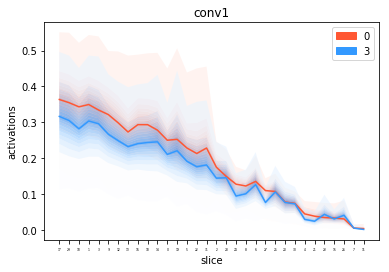

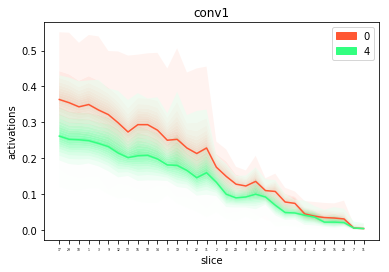

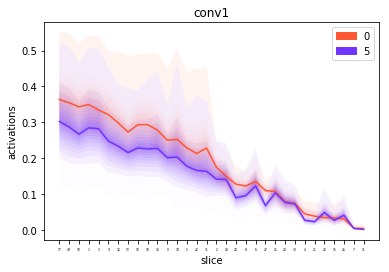

...

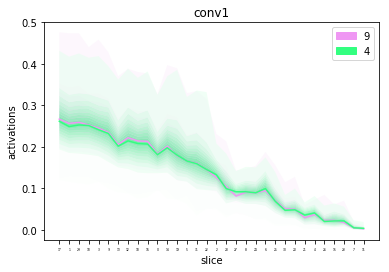

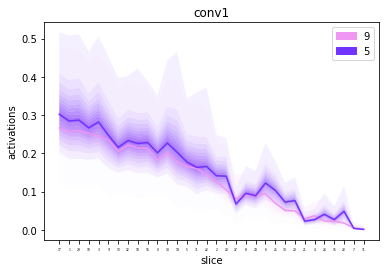

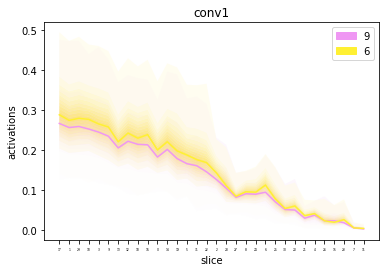

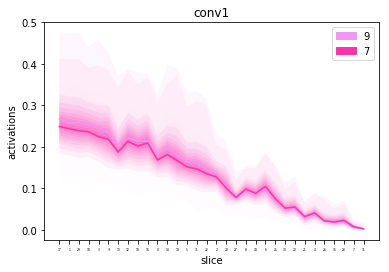

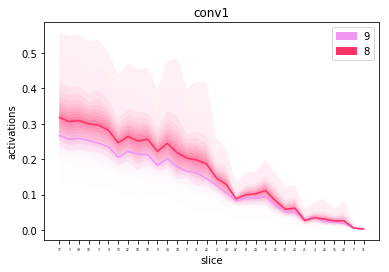

In [30]:
see_comp_gradient('conv1', alpha, amount)

### Conv2

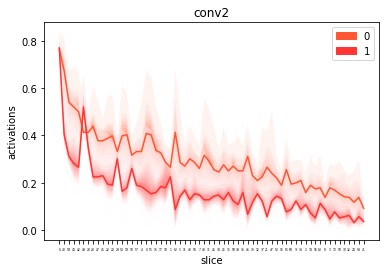

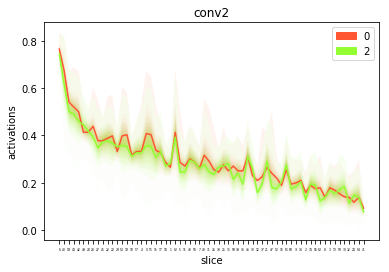

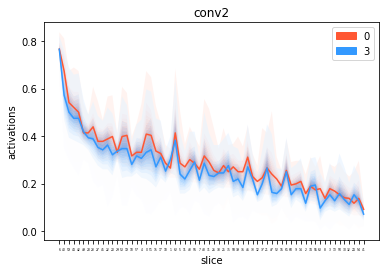

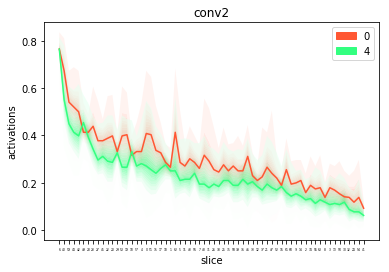

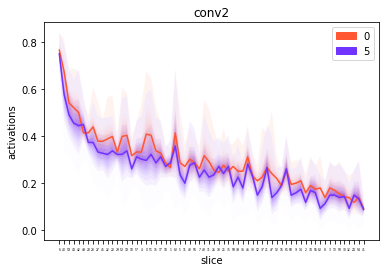

...

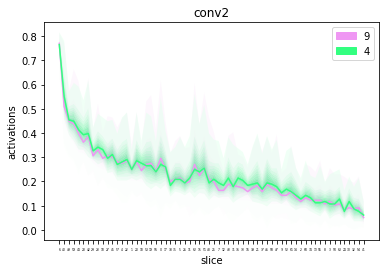

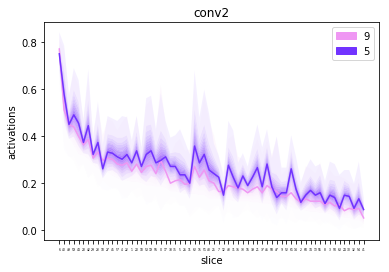

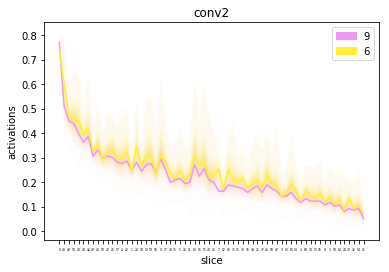

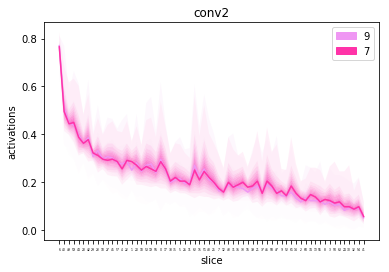

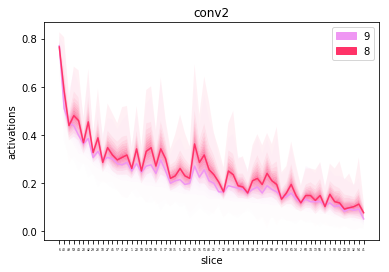

In [31]:
see_comp_gradient('conv2', alpha, amount)

### Dense

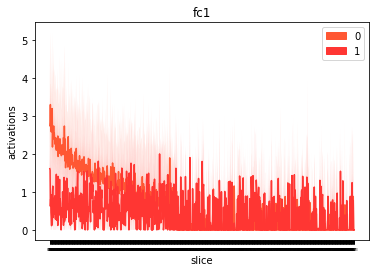

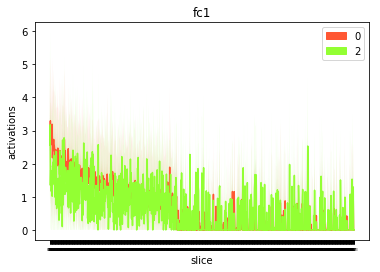

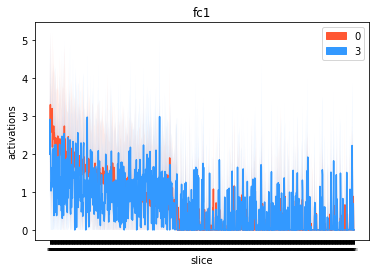

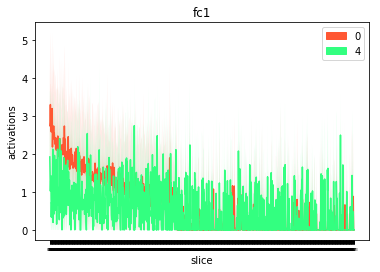

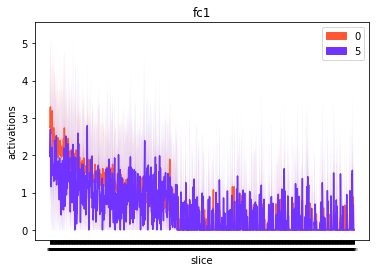

...

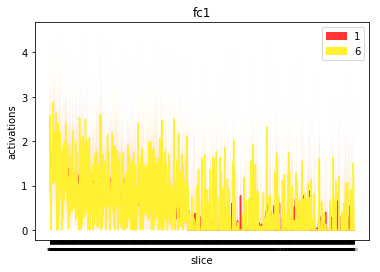

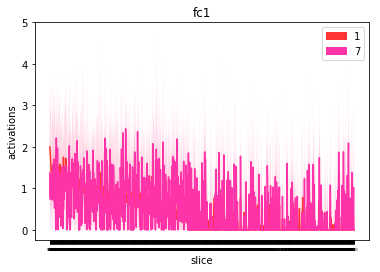

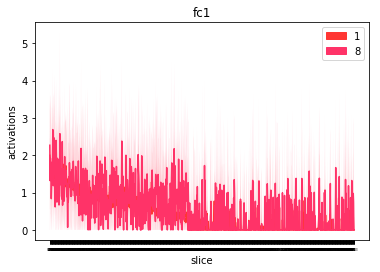

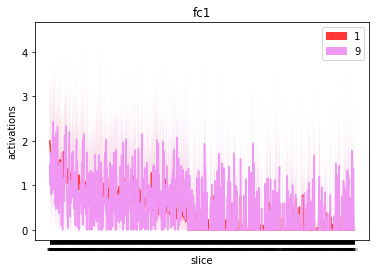

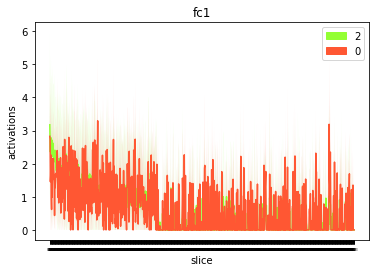

KeyboardInterrupt: 

In [14]:
see_comp_gradient('fc1')

In [29]:
import matplotlib.patches as mpatches
    
colors = ['#FF5733', '#FF3633', '#93FF33', '#3399FF', '#33FF80', '#7133FF', '#FFF033', '#FF33A8', '#FF3368', '#EF97F3']

alpha = 0.6
amount = 0.01

In [16]:
def see_comp_gradient(layer, alpha, amount):
    for stdlabel in range(10):
        
        # Sort the slice by standard label
        acts_label_std = act_Q_dict[stdlabel][layer]
        med_acts_label_std = acts_label_std[:, 1]
        sorted_slice = np.argsort(-np.array(med_acts_label_std)).astype(int)
        sorted_acts_std = np.array([acts_label_std[s] for s in sorted_slice])
        slices = list(range(len(sorted_slice)))
        
        for label in range(10):
            if label == stdlabel:
                continue
        
            # Activation of comparison layer
            layer_acts = act_Q_dict[label][layer]
            sorted_acts = np.array([layer_acts[s] for s in sorted_slice])

            # Draw half top ranges of std
            c1_std = colors[stdlabel]
            c2_std = lighten_color(c1_std, amount=amount)
            for i in range(int(N / 2)):
                color = gen_color(c1_std, c2_std, mix= 1 - (i * 2 / N))
                up_std, down_std = sorted_acts_std[:, i], sorted_acts_std[:, i + 1]
                plt.fill_between(slices, up_std, down_std, facecolor=color, alpha=alpha)

            # Draw half bottom ranges of std
            for i in range(int(N / 2), N):
                color = gen_color(c1_std, c2_std, mix= (i * 2 / N) - 1)
                up_std, down_std = sorted_acts_std[:, i], sorted_acts_std[:, i + 1]
                plt.fill_between(slices, up_std, down_std, facecolor=color, alpha=alpha)
                
            # Draw line of 50%
            plt.plot(sorted_acts_std[:, int(N / 2)], color=c1_std)

            # Draw half top ranges of comparison layer
            c1_comp = colors[label]
            c2_comp = lighten_color(c1_comp, amount=amount)
            for i in range(int(N / 2)):
                color = gen_color(c1_comp, c2_comp, mix= 1 - (i * 2 / N))
                up_comp, down_comp = sorted_acts[:, i], sorted_acts[:, i + 1]
                plt.fill_between(slices, up_comp, down_comp, facecolor=color, alpha=alpha)

            # Draw half bottom ranges of comparison layer
            for i in range(int(N / 2), N):
                color = gen_color(c1_comp, c2_comp, mix= (i * 2 / N) - 1)
                up_comp, down_comp = sorted_acts[:, i], sorted_acts[:, i + 1]
                plt.fill_between(slices, up_comp, down_comp, facecolor=color, alpha=alpha)
                    
            # Draw line of 50%
            plt.plot(sorted_acts[:, int(N / 2)], color=c1_comp)

            # labels
            std_patch = mpatches.Patch(color=c1_std, label=stdlabel)
            comp_patch = mpatches.Patch(color=c1_comp, label=label)
            plt.legend(handles=[std_patch, comp_patch])
            
            # titles
            plt.xticks(slices, sorted_slice, fontsize=3)
            plt.title(layer)
            plt.xlabel('slice')
            plt.ylabel('activations')
#             plt.savefig('{}/comp-with-label-q{}-{}-{}-{}.pdf'.format(dirpath, N, stdlabel, label, layer))
#             plt.clf()
            plt.show()

### See conv with color gradients

In [2]:
# Read all activation values
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
dirpath = '/Users/haekyu/data/interpretable-ml/result/act'
paradirpath = '/Users/haekyu/data/interpretable-ml/result/paras'

In [3]:
activation_all = pd.read_csv('./act_all.tsv', sep='\t')

In [4]:
# Parse data by labels
from collections import defaultdict
import numpy as np
from time import time

act_dict = defaultdict(lambda: defaultdict(lambda: {}))
total, tic = len(activation_all), time()
for index, row in activation_all.iterrows():
    if index % 3000 == 0:
        toc = time()
        print('    %d/%d=%.2lf, %.2lf sec' % (index, total, index / total, toc - tic))
        tic = time()
    label, layer, th, all_acts = row
    all_acts = np.array(all_acts.split(',')).astype(float)
    act_dict[label][layer][th] = all_acts

    0/12160=0.00, 0.00 sec
    3000/12160=0.25, 8.05 sec
    6000/12160=0.49, 7.49 sec
    9000/12160=0.74, 7.47 sec
    12000/12160=0.99, 7.87 sec


In [5]:
# Get percentile of the activations
from time import time

tic = time()

layernames = ['conv1', 'pool1', 'conv2', 'pool2', 'fc1']
act_Q_dict = defaultdict(lambda: defaultdict(lambda: []))
N = 20
for label in range(10):
    for layer in layernames:
        act_label_layer = act_dict[label][layer]
        for sliceth in act_label_layer:
            slice_act = act_label_layer[sliceth]
            Qs = [np.quantile(slice_act, q) for q in np.arange(0, 1.01, 1 / N)]
            act_Q_dict[label][layer].append(np.array(Qs))
        act_Q_dict[label][layer] = np.array(act_Q_dict[label][layer])

toc = time()
print('     Time: %.2lf sec' % (toc - tic))

     Time: 27.40 sec


In [6]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import rgb2hex

def gen_color(c1, c2, mix=0):
    '''
    Generate color which internally divides c1 and c2 with ratio of (1-mix: mix).
    The color is generated by linear interpolate from color c1 to c2.
    It returns c1 if mix=0, c2 if mix=1.
    * input
        - c1: first color in '#......' format
        - c2: second color in '#......' format
        - mix: internally dividing ratio between c1 and c2, in range [0, 1]. 
    * output
        - c: the output color, or an internally dividing points between c1 and c2
    '''

    # Check the validity of input
    assert len(c1) == len(c2)
    assert mix >= 0 and mix <= 1, 'mix=' + str(mix)
    
    # Extract RGB of c1 and c2
    rgb1 = np.array([int(c1[i : i + 2], 16) for i in range(1, len(c1), 2)])
    rgb2 = np.array([int(c2[i : i + 2], 16) for i in range(1, len(c2), 2)])
    
    # Get RGB of the output color c
    # by computing the internally dividing points between c1 and c2
    rgb = ((1 - mix) * rgb1 + mix * rgb2).astype(int)
    c = '#'+('{:}'*3).format(*[hex(a)[2:].zfill(2) for a in rgb])
    
    return c

In [7]:
import colorsys
import matplotlib.colors as mc

def lighten_color(color, amount=0.5):
    '''
    Lightens the given color by multiplying by the given amount.
    * input
        - color: input color in hex ('#......') format
        - amount: 1-luminosity. The lower, the more lightened.
    * output
        - c: lightened color in hex ('#......') format
    '''
    
    color = colorsys.rgb_to_hls(*mc.to_rgb(color))
    c = colorsys.hls_to_rgb(color[0], 1 - amount * (1 - color[1]), color[2])
    c = np.array(c) * 255
    c = c.astype(int)
    c_hex = '#'+('{:}'*3).format(*[hex(a)[2:].zfill(2) for a in c])

    return c_hex

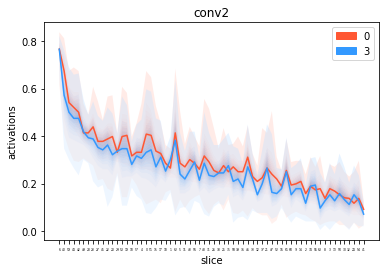

In [8]:
import matplotlib.patches as mpatches
    
colors = ['#FF5733', '#FF3633', '#93FF33', '#3399FF', '#33FF80', '#7133FF', '#FFF033', '#FF33A8', '#FF3368', '#EF97F3']

alpha = 0.4
amount = 0.2
'''
Before Bias, compare a standard label and each other label
'''
for stdlabel in range(1):
    for layer in ['conv2']:
        
        # Sort the slice by standard label
        acts_label_std = act_Q_dict[stdlabel][layer]
        med_acts_label_std = acts_label_std[:, 1]
        sorted_slice = np.argsort(-np.array(med_acts_label_std)).astype(int)
        sorted_acts_std = np.array([acts_label_std[s] for s in sorted_slice])
        slices = list(range(len(sorted_slice)))
        
        for label in range(3, 4):
            if label == stdlabel:
                continue
        
            # Activation of comparison layer
            layer_acts = act_Q_dict[label][layer]
            sorted_acts = np.array([layer_acts[s] for s in sorted_slice])

            # Draw half top ranges of std
            c1_std = colors[stdlabel]
            c2_std = lighten_color(c1_std, amount=amount)
            for i in range(int(N / 2)):
                color = gen_color(c1_std, c2_std, mix= 1 - (i * 2 / N))
                up_std, down_std = sorted_acts_std[:, i], sorted_acts_std[:, i + 1]
                plt.fill_between(slices, up_std, down_std, facecolor=color, alpha=alpha)

            # Draw half bottom ranges of std
            for i in range(int(N / 2), N):
                color = gen_color(c1_std, c2_std, mix= (i * 2 / N) - 1)
                up_std, down_std = sorted_acts_std[:, i], sorted_acts_std[:, i + 1]
                plt.fill_between(slices, up_std, down_std, facecolor=color, alpha=alpha)
                
            # Draw line of 50%
            plt.plot(sorted_acts_std[:, int(N / 2)], color=c1_std)

            # Draw half top ranges of comparison layer
            c1_comp = colors[label]
            c2_comp = lighten_color(c1_comp, amount=amount)
            for i in range(int(N / 2)):
                color = gen_color(c1_comp, c2_comp, mix= 1 - (i * 2 / N))
                up_comp, down_comp = sorted_acts[:, i], sorted_acts[:, i + 1]
                plt.fill_between(slices, up_comp, down_comp, facecolor=color, alpha=alpha)

            # Draw half bottom ranges of comparison layer
            for i in range(int(N / 2), N):
                color = gen_color(c1_comp, c2_comp, mix= (i * 2 / N) - 1)
                up_comp, down_comp = sorted_acts[:, i], sorted_acts[:, i + 1]
                plt.fill_between(slices, up_comp, down_comp, facecolor=color, alpha=alpha)
                    
            # Draw line of 50%
            plt.plot(sorted_acts[:, int(N / 2)], color=c1_comp)

            # labels
            std_patch = mpatches.Patch(color=c1_std, label=stdlabel)
            comp_patch = mpatches.Patch(color=c1_comp, label=label)
            plt.legend(handles=[std_patch, comp_patch])
            
            # titles
            plt.xticks(slices, sorted_slice, fontsize=3)
            plt.title(layer)
            plt.xlabel('slice')
            plt.ylabel('activations')
#             plt.savefig('{}/comp-with-label-q{}-{}-{}-{}.pdf'.format(dirpath, N, stdlabel, label, layer))
#             plt.clf()
            plt.show()


### See conv all

In [32]:
# Read all activation values
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
dirpath = '/Users/haekyu/data/interpretable-ml/result/act'
paradirpath = '/Users/haekyu/data/interpretable-ml/result/paras'

In [31]:
activation_all = pd.read_csv('./act_all.tsv', sep='\t')

In [2]:
activation_all[:3]

,label,layer,slice,acts
0,0,conv1,0,"0.26658163265306123,0.24872448979591838,0.2665..."
1,0,conv1,1,"0.3673469387755102,0.3392857142857143,0.376275..."
2,0,conv1,2,"0.1989795918367347,0.1556122448979592,0.198979..."


In [15]:
# Parse data by labels
from collections import defaultdict
import numpy as np
from time import time

act_dict = defaultdict(lambda: defaultdict(lambda: {}))
total, tic = len(activation_all), time()
for index, row in activation_all.iterrows():
    if index % 3000 == 0:
        toc = time()
        print('    %d/%d=%.2lf, %.2lf sec' % (index, total, index / total, toc - tic))
        tic = time()
    label, layer, th, all_acts = row
    all_acts = np.array(all_acts.split(',')).astype(float)
    act_dict[label][layer][th] = all_acts

    0/12160=0.00, 0.00 sec
    3000/12160=0.25, 10.06 sec
    6000/12160=0.49, 9.26 sec
    9000/12160=0.74, 9.14 sec
    12000/12160=0.99, 9.20 sec


In [45]:
# Get Q1, Q2, Q3 of the activations
layernames = ['conv1', 'pool1', 'conv2', 'pool2', 'fc1']
act_Q_dict = defaultdict(lambda: defaultdict(lambda: []))
for label in range(10):
    for layer in layernames:
        act_label_layer = act_dict[label][layer]
        for sliceth in act_label_layer:
            slice_act = act_label_layer[sliceth]
            q1 = np.quantile(slice_act, 0.25)
            q2 = np.quantile(slice_act, 0.5)
            q3 = np.quantile(slice_act, 0.75)
            act_Q_dict[label][layer].append(np.array([q1, q2, q3]))
        act_Q_dict[label][layer] = np.array(act_Q_dict[label][layer])

In [46]:
# Get slice order of label 0
act_Q_dict[0]['conv1']

array([[0.22704082, 0.25      , 0.27295918],
       [0.31377551, 0.3494898 , 0.38137755],
       [0.15688776, 0.1747449 , 0.19005102],
       [0.30102041, 0.33418367, 0.36607143],
       [0.03571429, 0.04464286, 0.05229592],
       [0.20153061, 0.22831633, 0.25382653],
       [0.11479592, 0.13520408, 0.15306122],
       [0.00382653, 0.00510204, 0.00637755],
       [0.10969388, 0.12244898, 0.13265306],
       [0.28443878, 0.32142857, 0.35331633],
       [0.31122449, 0.34311224, 0.37244898],
       [0.00127551, 0.00382653, 0.00510204],
       [0.26530612, 0.29846939, 0.33035714],
       [0.24872449, 0.27295918, 0.29719388],
       [0.24362245, 0.27806122, 0.30994898],
       [0.0255102 , 0.03316327, 0.04081633],
       [0.26020408, 0.29336735, 0.32397959],
       [0.32908163, 0.36352041, 0.39540816],
       [0.26147959, 0.29336735, 0.32270408],
       [0.21428571, 0.25255102, 0.29209184],
       [0.06377551, 0.07780612, 0.08928571],
       [0.03188776, 0.03826531, 0.04719388],
       [0.

In [75]:
colors = ['red', 'orange', 'green', 'blue', 'indianred', 'y', 'gold', 'indigo', 'hotpink', 'lightcoral']

'''
Before Bias, compare a standard label and each other label
'''
for stdlabel in range(10):
    for layer in ['conv2']:
        # Sort the slice by standard label
        acts_label_std = act_Q_dict[stdlabel][layer]
        med_acts_label_std = acts_label_std[:, 1]
        sorted_slice = np.argsort(-np.array(med_acts_label_std)).astype(int)
        sorted_acts_std = np.array([acts_label_std[s] for s in sorted_slice])
        slices = list(range(len(sorted_slice)))
        q1_std, q2_std, q3_std = sorted_acts_std[:, 0], sorted_acts_std[:, 1], sorted_acts_std[:, 2]

        for label in range(10):
            if label == stdlabel:
                continue
            layer_acts = act_Q_dict[label][layer]
            sorted_acts = np.array([layer_acts[s] for s in sorted_slice])

            q1_label, q2_label, q3_label = sorted_acts[:, 0], sorted_acts[:, 1], sorted_acts[:, 2]

            plt.fill_between(slices, q1_std, q3_std, facecolor=colors[stdlabel], alpha=0.6)
            plt.fill_between(slices, q1_label, q3_label, facecolor=colors[label], alpha=0.6)
            plt.xticks(slices, sorted_slice, fontsize=3)
            plt.legend((stdlabel , label))
            plt.title(layer)
            plt.xlabel('slice')
            plt.ylabel('activations')
            plt.savefig('{}/comp-with-label-q123-{}-{}-{}.pdf'.format(dirpath, stdlabel, label, layer))
            plt.clf()


<Figure size 432x288 with 0 Axes>

In [74]:
'''
Before Bias, compare 0 and all
'''
for layer in ['conv2']:
    # Sort the slice by label 0
    acts_label0 = act_Q_dict[0][layer]
    med_acts_label0 = acts_label0[:, 1]
    sorted_slice = np.argsort(-np.array(med_acts_label0)).astype(int)
    sorted_acts_0 = np.array([acts_label0[s] for s in sorted_slice])
    slices = list(range(len(sorted_slice)))
    q1_0, q2_0, q3_0 = sorted_acts_0[:, 0], sorted_acts_0[:, 1], sorted_acts_0[:, 2]
    plt.fill_between(slices, q1_0, q3_0, facecolor=colors[0], alpha=0.6)
    
    for label in range(1, 10):
        layer_acts = act_Q_dict[label][layer]
        sorted_acts = np.array([layer_acts[s] for s in sorted_slice])
        
        q1_label, q2_label, q3_label = sorted_acts[:, 0], sorted_acts[:, 1], sorted_acts[:, 2]
        plt.fill_between(slices, q1_label, q3_label, facecolor=colors[label], alpha=0.6)
        
    patches = [mpatches.Patch(color=c, label=th) for th, c in enumerate(colors[:10])]
    plt.legend(handles=patches)
    plt.xticks(slices, sorted_slice, fontsize=3)
    plt.title(layer)
    plt.xlabel('slice')
    plt.ylabel('activations')
    plt.savefig('{}/comp-with-label-q123-0-all-{}.pdf'.format(dirpath, layer))
    plt.clf()
    

<Figure size 432x288 with 0 Axes>

### See conv median

In [17]:
# Read actiavtion values
import pandas as pd
activation_df = pd.read_csv('./act.csv')

from collections import defaultdict
activations = defaultdict(lambda: defaultdict(lambda: {}))
for index, row in activation_df.iterrows():
    label, layer, th, med = row
    activations[label][layer][th] = med

In [18]:
# Sort the slices
cell_sort = defaultdict(lambda: {})
layernames = ['conv1', 'pool1', 'conv2', 'pool2', 'fc1']
for label in range(10):
    for layer in layernames:
        slice_activation_map = activations[label][layer]
        sorted_slice = sorted(slice_activation_map, key=slice_activation_map.get)
        cell_sort[label][layer] = sorted_slice

In [19]:
# Print the cell_sort
for layer in layernames:
    print('      ------{}------'.format(layer))
    for label in range(10):
        sorted_slice = cell_sort[label][layer]
        print('      {}\t{}'.format(label, sorted_slice))

      ------conv1------
      0	[11, 7, 26, 15, 23, 21, 4, 30, 20, 25, 27, 8, 24, 6, 28, 2, 22, 5, 31, 0, 19, 13, 14, 16, 18, 12, 9, 3, 10, 1, 29, 17]
      1	[11, 7, 26, 23, 15, 20, 21, 30, 25, 4, 28, 6, 24, 8, 27, 2, 22, 5, 31, 19, 0, 14, 13, 18, 16, 9, 3, 12, 29, 1, 17, 10]
      2	[11, 7, 15, 4, 21, 26, 23, 30, 20, 27, 24, 8, 25, 6, 28, 2, 22, 31, 5, 0, 19, 13, 16, 18, 14, 12, 9, 10, 3, 1, 29, 17]
      3	[11, 7, 21, 4, 15, 26, 23, 30, 20, 27, 24, 8, 25, 6, 2, 28, 22, 31, 5, 0, 19, 13, 16, 18, 14, 12, 9, 10, 3, 1, 29, 17]
      4	[11, 7, 26, 15, 23, 21, 4, 30, 20, 25, 24, 8, 27, 6, 28, 2, 22, 31, 5, 19, 0, 14, 13, 16, 18, 12, 9, 3, 1, 10, 29, 17]
      5	[11, 7, 21, 4, 15, 26, 23, 27, 30, 20, 24, 8, 25, 6, 28, 2, 31, 22, 5, 0, 19, 13, 18, 14, 16, 12, 9, 10, 3, 1, 29, 17]
      6	[11, 7, 15, 26, 23, 21, 4, 30, 20, 25, 27, 24, 8, 28, 6, 2, 22, 31, 5, 19, 0, 13, 14, 18, 16, 12, 9, 3, 1, 10, 29, 17]
      7	[11, 7, 15, 26, 23, 21, 4, 30, 20, 25, 27, 24, 8, 28, 6, 2, 22, 31, 5, 19, 0, 1

In [ ]:
# Draw plot


In [35]:
# Find out similar labels
# by ranking correlation of the slices
from scipy.stats import spearmanr as tau

sims = {}
for layer in layernames:
    sims[layer] = {}
    for label0 in range(10):
        for label1 in range(10):
            if (label0, label1) in sims[layer]:
                continue
            if (label1, label0) in sims[layer]:
                continue
            if label0 == label1:
                continue
            rank0 = cell_sort[label0][layer]
            rank1 = cell_sort[label1][layer]
            corr, p = tau(rank0, rank1)
            sims[layer][(label0, label1)] = corr

In [42]:
# Plot the similarity by confusion matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

for layer in layernames:
    print('      -------- {} -------'.format(layer))
    sorted_pairs = sorted(sims[layer], key=sims[layer].get)
    for th, pair in enumerate(sorted_pairs):
        if th % 10 == 0:
            print('\n      ', pair, end="\t")
        else:
            print(pair, end="\t")
    print('\n')

      -------- conv1 -------

       (0, 7)	(1, 3)	(1, 7)	(5, 7)	(3, 7)	(1, 6)	(2, 7)	(1, 2)	(0, 6)	(1, 9)	
       (5, 6)	(3, 9)	(3, 6)	(1, 5)	(1, 4)	(0, 3)	(2, 6)	(7, 8)	(4, 7)	(3, 8)	
       (1, 8)	(7, 9)	(3, 4)	(0, 9)	(0, 1)	(0, 8)	(5, 9)	(0, 4)	(2, 9)	(0, 2)	
       (5, 8)	(0, 5)	(4, 6)	(4, 5)	(3, 5)	(6, 8)	(2, 8)	(6, 9)	(2, 4)	(2, 3)	
       (6, 7)	(4, 9)	(8, 9)	(2, 5)	(4, 8)	

      -------- pool1 -------

       (1, 3)	(1, 6)	(1, 2)	(5, 7)	(3, 7)	(2, 7)	(3, 4)	(2, 4)	(3, 9)	(4, 5)	
       (1, 5)	(0, 1)	(6, 7)	(3, 8)	(0, 3)	(4, 6)	(7, 8)	(5, 9)	(6, 9)	(6, 8)	
       (1, 8)	(0, 7)	(4, 8)	(2, 9)	(0, 4)	(0, 6)	(3, 6)	(1, 9)	(8, 9)	(2, 8)	
       (5, 6)	(7, 9)	(0, 2)	(1, 4)	(2, 3)	(4, 9)	(1, 7)	(5, 8)	(0, 5)	(0, 9)	
       (2, 6)	(3, 5)	(0, 8)	(2, 5)	(4, 7)	

      -------- conv2 -------

       (1, 5)	(0, 8)	(0, 5)	(5, 6)	(2, 6)	(1, 8)	(5, 9)	(3, 7)	(2, 7)	(2, 8)	
       (1, 7)	(3, 6)	(0, 7)	(3, 9)	(1, 4)	(3, 4)	(1, 2)	(4, 8)	(0, 2)	(0, 6)	
       (1, 6)	(0, 9)	(4, 5)	(1, 3)	(7, 9)	